In [2]:
### Two Game of Life implementations that I stole
## https://jakevdp.github.io/blog/2013/08/07/conways-game-of-life/



import numpy as np

def life_step_1(X):
    """Game of life step using generator expressions"""
    nbrs_count = sum(np.roll(np.roll(X, i, 0), j, 1)
                     for i in (-1, 0, 1) for j in (-1, 0, 1)
                     if (i != 0 or j != 0))
    return (nbrs_count == 3) | (X & (nbrs_count == 2))

def life_step_2(X):
    """Game of life step using scipy tools"""
    from scipy.signal import convolve2d
    nbrs_count = convolve2d(X, np.ones((3, 3)), mode='same', boundary='wrap') - X
    return (nbrs_count == 3) | (X & (nbrs_count == 2))
    
life_step = life_step_1

In [3]:
%pylab inline
%matplotlib inline

Populating the interactive namespace from numpy and matplotlib


In [3]:
from matplotlib.animation import Animation

In [4]:
### Animating the Game of Life using JSAnimation and Ipython (also from jakevdp)


# JSAnimation import available at https://github.com/jakevdp/JSAnimation
# from JSAnimation.IPython_display import display_animation, anim_to_html
from matplotlib import animation

def life_animation(X, dpi=10, frames=10, interval=300, mode='loop'):
    """Produce a Game of Life Animation
    
    Parameters
    ----------
    X : array_like
        a two-dimensional numpy array showing the game board
    dpi : integer
        the number of dots per inch in the resulting animation.
        This controls the size of the game board on the screen
    frames : integer
        The number of frames to compute for the animation
    interval : float
        The time interval (in milliseconds) between frames
    mode : string
        The default mode of the animation.  Options are ['loop'|'once'|'reflect']
    """
    X = np.asarray(X)
    assert X.ndim == 2
    X = X.astype(bool)
    
    X_blank = np.zeros_like(X)
    figsize = (X.shape[1] * 1. / dpi, X.shape[0] * 1. / dpi)

    fig = plt.figure(figsize=figsize, dpi=dpi)
    ax = fig.add_axes([0, 0, 1, 1], xticks=[], yticks=[], frameon=False)
    im = ax.imshow(X, cmap=plt.cm.binary, interpolation='nearest')
    im.set_clim(-0.05, 1)  # Make background gray

    # initialization function: plot the background of each frame
    def init():
        im.set_data(X_blank)
        return (im,)

    # animation function.  This is called sequentially
    def animate(i):
        im.set_data(animate.X)
        animate.X = life_step(animate.X)
        return (im,)
    animate.X = X

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=frames, interval=interval)
    
    #print anim_to_html(anim)
    return anim

In [4]:
np.random.seed(0)
X = np.zeros((300, 400), dtype=bool)
r = np.random.random((100, 200))
X[100:200, 100:300] = (r > 0.75)
life_animation(X, dpi=1000, frames=40, mode='once')

NameError: name 'life_animation' is not defined

In [5]:
np.random.seed(0)
X2 = np.zeros((30, 40), dtype=bool)
r1 = np.random.random((30, 40))
X2 = (r1 > 0.75)
life_animation(X2, dpi=10, frames=40, mode='once')

NameError: name 'life_animation' is not defined

In [6]:
## Another game of life implementation I stole!!
## http://www.labri.fr/perso/nrougier/teaching/numpy/numpy.html


## This one checks the life of each neighbour in compute_neighbours, 
## then iterates the game of life based on the number of neighbours.


A = np.array([[0,0,0,0,0,0],
                  [0,0,0,1,0,0],
                  [0,1,0,1,0,0],
                  [0,0,1,1,0,0],
                  [0,0,0,0,0,0],
                  [0,0,0,0,0,0]])

#Z = np.zeros((6,6),dtype = int)

def compute_neighbours(Z):
    shape = len(Z), len(Z[0])
    N  = [[0,]*(shape[0])  for i in range(shape[1])]
    for x in range(1,shape[0]-1):
        for y in range(1,shape[1]-1):
            N[x][y] = Z[x-1][y-1]+Z[x][y-1]+Z[x+1][y-1] \
                    + Z[x-1][y]            +Z[x+1][y]   \
                    + Z[x-1][y+1]+Z[x][y+1]+Z[x+1][y+1]
    return N

def iterate(Z):
    N = compute_neighbours(Z)
    shape = len(Z), len(Z[0])
    for x in range(1,shape[0]-1):
        for y in range(1,shape[1]-1):
            if Z[x][y] == 1 and (N[x][y] < 2 or N[x][y] > 3):
                 Z[x][y] = 0
            elif Z[x][y] == 0 and N[x][y] == 3:
                 Z[x][y] = 1
    return Z




Install opencv.
Best option is `pip install opencv-python`

In [4]:


import cv2
tree = cv2.imread("tree.jpg")
# print(tree)

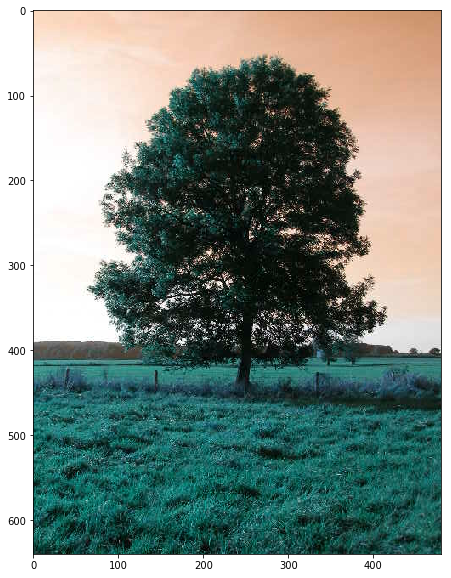

In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize = (10,10))
plt.imshow(tree, aspect='equal')



In [6]:
## make a basic grid version in matplotlib

from matplotlib import cm


In [14]:
expanded = np.zeros((100,100))
data = np.random.random((10,10))
index = 0

for x_square in range(10):
    for y_square in range(10):
        ## fill square in expanded
        local_y = 10 * y_square
        local_x = 10 * x_square

        for x in range(local_x, local_x + 10):
            for y in range(local_y, local_y + 10):
                expanded[x, y] = data[x_square, y_square]

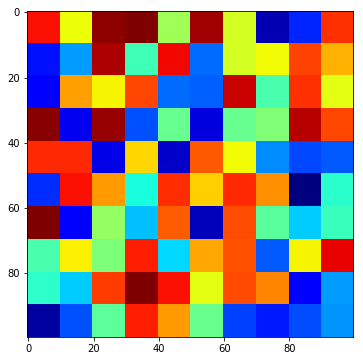

In [17]:
fig, ax = plt.subplots(figsize=(6,6))
plt.imshow(expanded, cmap='jet')

In [18]:
def decimal_mod(dec, modulo):
    intg = int(dec * 100)
    alive = intg % modulo == 0
    return alive

t = np.vectorize(decimal_mod)

In [54]:
expanded = np.zeros((100,100))
data = np.random.random((10,10))
index = 0

for x_square in range(10):
    for y_square in range(10):
        ## fill square in expanded
        local_y = 10 * y_square
        local_x = 10 * x_square

        for x in range(local_x, local_x + 10):
            for y in range(local_y, local_y + 10):
                expanded[x, y] = data[x_square, y_square]

start_grid = t(expanded, 5)
steps = []
images = []
step = start_grid
for i in range(1000):
    
    step = life_step(step)
    change_points = expanded[step]
    i = np.argsort(np.arange(0,len(change_points)))
    temp = np.zeros_like(expanded)
    temp[step] = expanded[np.mod(np.where(step)[0] + 1,100),np.where(step)[1]]
    expanded[step] = expanded[np.mod(np.where(step)[0] + 1,100),np.where(step)[1]]
    steps.append(temp)
    temp_image = expanded.copy()
    images.append(temp_image)
    
    

/home/tms/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.from_iter(generator)) or the python sum builtin instead.
  # This is added back by InteractiveShellApp.init_path()


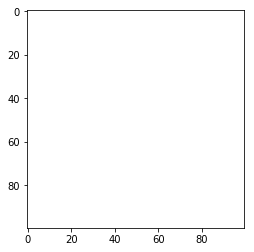

In [55]:
%matplotlib inline
from matplotlib import rc
from IPython.display import HTML


fig = plt.figure()

ims = [[plt.imshow(s,animated=True)] for s in steps]
# ims = [[plt.imshow(s,animated=True)] for s in images]


ani = animation.ArtistAnimation(fig, ims, interval=50, 
                                blit=True, repeat_delay=1000)


In [56]:

HTML(ani.to_jshtml())

In [455]:
# frame
# t(expanded, 5)

# update


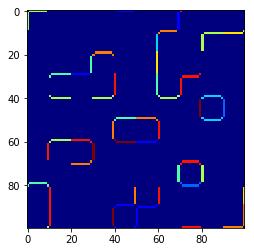

In [477]:
plt.imshow(steps[0],cmap=tp)

In [9]:
tree.shape

(640, 480, 3)

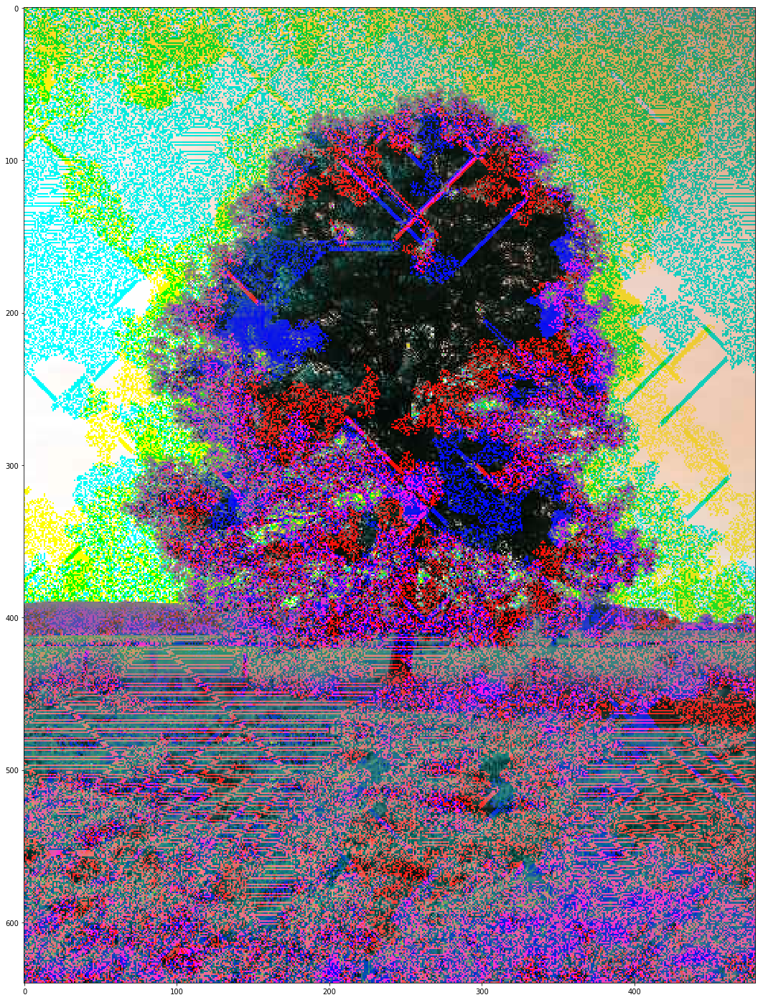

In [46]:
### A really basic go at using game of life to bend an image


tree2 = tree

tree2_red = tree2[:,:,0]

tree2_green = tree2[:,:,1]

tree2_blue = tree2[:,:,2]


tree_of_life_red = (tree[:,:,0]<130)

tree_of_life_blue = (tree[:,:,2]<130)

tree_of_life_green = (tree[:,:,1]<130)

fig, ax = plt.subplots(figsize = (25,25))

for i in range(30):
        
    plt.imshow(tree2)
    
    for i in range(10):
        tree_of_life_red = life_step(tree_of_life_red)

        tree2_red[tree_of_life_red] = 255 - tree[:,:,0][tree_of_life_red]

        tree_of_life_blue = life_step(tree_of_life_blue)

        tree2_blue[tree_of_life_blue] = 255 - tree[:,:,2][tree_of_life_blue]

        tree_of_life_green = life_step(tree_of_life_green)

        tree2_blue[tree_of_life_green] = 255 - tree[:,:,1][tree_of_life_green]
    
    
    

